In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(color_codes = True)
import scipy.stats as stats
from scipy.stats import norm
import warnings
warnings.filterwarnings('ignore')

In [88]:


walmart_df = pd.read_csv('/content/walmart_data.csv')

In [89]:
walmart_df.head()

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category,Purchase
0,1000001,P00069042,F,0-17,10,A,2,0,3,8370
1,1000001,P00248942,F,0-17,10,A,2,0,1,15200
2,1000001,P00087842,F,0-17,10,A,2,0,12,1422
3,1000001,P00085442,F,0-17,10,A,2,0,12,1057
4,1000002,P00285442,M,55+,16,C,4+,0,8,7969


In [90]:
walmart_df.tail()

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category,Purchase
550063,1006033,P00372445,M,51-55,13,B,1,1,20,368
550064,1006035,P00375436,F,26-35,1,C,3,0,20,371
550065,1006036,P00375436,F,26-35,15,B,4+,1,20,137
550066,1006038,P00375436,F,55+,1,C,2,0,20,365
550067,1006039,P00371644,F,46-50,0,B,4+,1,20,490


In [91]:
#Shape of the dataframe
walmart_df.shape

(550068, 10)

In [92]:
#Name of each column in dataframe
walmart_df.columns

Index(['User_ID', 'Product_ID', 'Gender', 'Age', 'Occupation', 'City_Category',
       'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category',
       'Purchase'],
      dtype='object')

In [93]:
#Datatype of each column in DataFrame

walmart_df.dtypes

,0
User_ID,int64
Product_ID,object
Gender,object
Age,object
Occupation,int64
City_Category,object
Stay_In_Current_City_Years,object
Marital_Status,int64
Product_Category,int64
Purchase,int64


**Finding Unique Values and Count Them**

Next, we'll find out the unique values in each column. This will help us understand how varied the data is.

In [94]:
def print_unique_values(df):
    for column in df.columns:
        unique_values = df[column].unique()
        print(f"\nUnique Values of {column}: ", unique_values)

# Example usage
print_unique_values(walmart_df)


Unique Values of User_ID:  [1000001 1000002 1000003 ... 1004113 1005391 1001529]

Unique Values of Product_ID:  ['P00069042' 'P00248942' 'P00087842' ... 'P00370293' 'P00371644'
 'P00370853']

Unique Values of Gender:  ['F' 'M']

Unique Values of Age:  ['0-17' '55+' '26-35' '46-50' '51-55' '36-45' '18-25']

Unique Values of Occupation:  [10 16 15  7 20  9  1 12 17  0  3  4 11  8 19  2 18  5 14 13  6]

Unique Values of City_Category:  ['A' 'C' 'B']

Unique Values of Stay_In_Current_City_Years:  ['2' '4+' '3' '1' '0']

Unique Values of Marital_Status:  [0 1]

Unique Values of Product_Category:  [ 3  1 12  8  5  4  2  6 14 11 13 15  7 16 18 10 17  9 20 19]

Unique Values of Purchase:  [ 8370 15200  1422 ...   135   123   613]


In [95]:
def print_nunique_values(df):
    for column in df.columns:
        unique_values = df[column].nunique()
        print(f"\nUnique Values of {column}: ", unique_values)

# Example usage
print_nunique_values(walmart_df)


Unique Values of User_ID:  5891

Unique Values of Product_ID:  3631

Unique Values of Gender:  2

Unique Values of Age:  7

Unique Values of Occupation:  21

Unique Values of City_Category:  3

Unique Values of Stay_In_Current_City_Years:  5

Unique Values of Marital_Status:  2

Unique Values of Product_Category:  20

Unique Values of Purchase:  18105


**Data Cleaning**

We'll make some changes to the data for better analysis. For example, we'll adjust the 'Stay_In_Current_City_Years' column by removing the '+' symbol and converting it to a numeric format. But first, let's look the unique values.

In [96]:
walmart_df.Stay_In_Current_City_Years.unique()

array(['2', '4+', '3', '1', '0'], dtype=object)

In [97]:
# Removing "+" symbol
walmart_df.Stay_In_Current_City_Years=walmart_df.Stay_In_Current_City_Years.str.replace("+","")

In [98]:
walmart_df.Stay_In_Current_City_Years.unique()

array(['2', '4', '3', '1', '0'], dtype=object)

In [99]:
walmart_df['Stay_In_Current_City_Years'] = pd.to_numeric(walmart_df['Stay_In_Current_City_Years'])


**Statistical Summary**

Here, we'll look at some statistics of the data. This includes things like mean, standard deviation, minimum, and maximum values. It will give us a good idea of the overall distribution and range of the data. But before that, we are going to select data types that is numerical.

In [100]:
walmart_df.select_dtypes(include=['int64']).skew()

,0
User_ID,0.003066
Occupation,0.400140
Stay_In_Current_City_Years,0.317236
Marital_Status,0.367437
Product_Category,1.025735
Purchase,0.600140


In [101]:
walmart_df.describe(include = 'all')


,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category,Purchase
count,5.500680e+05,550068,550068,550068,550068.000000,550068,550068.000000,550068.000000,550068.000000,550068.000000
unique,NaN,3631,2,7,NaN,3,NaN,NaN,NaN,NaN
top,NaN,P00265242,M,26-35,NaN,B,NaN,NaN,NaN,NaN
freq,NaN,1880,414259,219587,NaN,231173,NaN,NaN,NaN,NaN
mean,1.003029e+06,NaN,NaN,NaN,8.076707,NaN,1.858418,0.409653,5.404270,9263.968713
std,1.727592e+03,NaN,NaN,NaN,6.522660,NaN,1.289443,0.491770,3.936211,5023.065394
min,1.000001e+06,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,1.000000,12.000000
25%,1.001516e+06,NaN,NaN,NaN,2.000000,NaN,1.000000,0.000000,1.000000,5823.000000
50%,1.003077e+06,NaN,NaN,NaN,7.000000,NaN,2.000000,0.000000,5.000000,8047.000000
75%,1.004478e+06,NaN,NaN,NaN,14.000000,NaN,3.000000,1.000000,8.000000,12054.000000


We'll share some key observations from the analysis. This could include things like which age group buys the most, which city has the most sales, etc.

**Observations from Analysis**

There are no missing values in the data.

Customers with age group of 26-35 have done more purchases (2,19,587) compared with others

Customers in City_Category of B have done more purchases (2,31,173) compared with other City_Category Out of 5,50,000 data point. 4,14,259's gender is Male and rest are the Female. Customer with Minimum amount of Purchase is $12

Customer with Maximum amount of Purchase is $23961

Purchase might have outliers

**Missing Value Detection**

We'll check if there are any missing values in the data. Missing values can affect the analysis, so it's important to know if there are any. So Let's check the missing values in our dataset

In [102]:
# Missing value detection
walmart_df.isna().sum()

,0
User_ID,0
Product_ID,0
Gender,0
Age,0
Occupation,0
City_Category,0
Stay_In_Current_City_Years,0
Marital_Status,0
Product_Category,0
Purchase,0


**Duplicate Value Detection**

We'll also look for any duplicate entries in the data. Duplicates can skew our analysis, so we need to identify and handle them.

In [103]:
# Checking duplicate values in the data set
walmart_df.duplicated(subset=None,keep='first').sum() # No duplicate values in the data set

np.int64(0)

**Data Visualization**


First, let's do data visualization for our numerical values.

In [104]:
walmart_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550068 entries, 0 to 550067
Data columns (total 10 columns):
 #   Column                      Non-Null Count   Dtype 
---  ------                      --------------   ----- 
 0   User_ID                     550068 non-null  int64 
 1   Product_ID                  550068 non-null  object
 2   Gender                      550068 non-null  object
 3   Age                         550068 non-null  object
 4   Occupation                  550068 non-null  int64 
 5   City_Category               550068 non-null  object
 6   Stay_In_Current_City_Years  550068 non-null  int64 
 7   Marital_Status              550068 non-null  int64 
 8   Product_Category            550068 non-null  int64 
 9   Purchase                    550068 non-null  int64 
dtypes: int64(6), object(4)
memory usage: 42.0+ MB


**Data Visualization with Numerical Features**

In this part, we'll create visual representations of the numerical data. This will include graphs showing distributions of various numerical features like occupation, years in the current city, marital status, and purchase amounts. Graphs help us see patterns and trends more easily than looking at numbers alone.

In [105]:
[col for col in walmart_df.select_dtypes(include=['int64']).columns]

['User_ID',
 'Occupation',
 'Stay_In_Current_City_Years',
 'Marital_Status',
 'Product_Category',
 'Purchase']

Of course from that list, we can remove User_ID amd Product_Category, because that wont contribute to our analysis.



The mu (mean) is 9263.968712959126 and sigma (standard deviation) is 5023.060827959928 for the curve


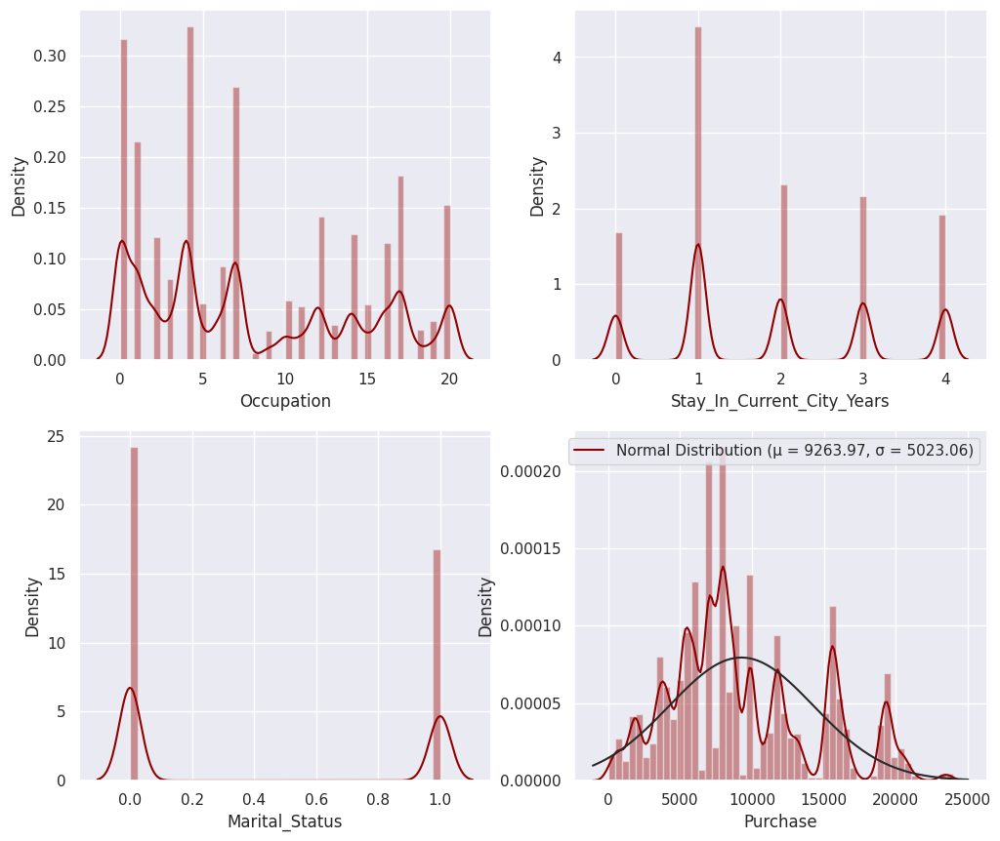

In [106]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import norm

# Create a 2x2 grid of subplots
fig, axis = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
fig.subplots_adjust(top=0.9)  # Adjust the top spacing of the subplots

# Plot distribution plots for each specified column
sns.distplot(walmart_df['Occupation'], kde=True, ax=axis[0,0], color="#900000")
sns.distplot(walmart_df['Stay_In_Current_City_Years'].astype(int), kde=True, ax=axis[0,1], color="#900000")
sns.distplot(walmart_df['Marital_Status'], kde=True, ax=axis[1,0], color="#900000")

# Plotting a distribution plot for the 'Purchase' variable with normal curve fit
sns.distplot(walmart_df['Purchase'], ax=axis[1,1], color="#900000", fit=norm)

# Fitting the target variable to the normal curve
mu, sigma = norm.fit(walmart_df['Purchase'])
print("The mu (mean) is {} and sigma (standard deviation) is {} for the curve".format(mu, sigma))

# Adding a legend for the 'Purchase' distribution plot
axis[1,1].legend(['Normal Distribution (μ = {:.2f}, σ = {:.2f})'.format(mu, sigma)], loc='best')

# Show the plots
plt.show()

The mu (mean) is 9263.968712959126 and sigma (standard deviation) is 5023.060827959928 for the curve


In [107]:
import plotly.io as pio
pio.renderers.default = "iframe"

In [108]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
pio.renderers.default = "colab"

# Create subplots
fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=("Gender", "Age", "Occupation", "City Category",
                    "Stay In Current City Years", "Marital Status", "Product Category", "Purchase")
)

# Add histograms for each subplot
fig.add_trace(go.Histogram(x=walmart_df['Gender']), row=1, col=1)
fig.add_trace(go.Histogram(x=walmart_df['Age']), row=1, col=2)
fig.add_trace(go.Histogram(x=walmart_df['Occupation']), row=2, col=1)
fig.add_trace(go.Histogram(x=walmart_df['City_Category']), row=2, col=2)
fig.add_trace(go.Histogram(x=walmart_df['Stay_In_Current_City_Years']), row=3, col=1)
fig.add_trace(go.Histogram(x=walmart_df['Marital_Status']), row=3, col=2)
fig.add_trace(go.Histogram(x=walmart_df['Product_Category']), row=4, col=1)
fig.add_trace(go.Histogram(x=walmart_df['Purchase']), row=4, col=2)

# Update layout if needed
fig.update_layout(height=1200, width=1000, title_text="Count Plots")
fig.update_layout(showlegend=False)  # Hide the legend if not needed

# Show the figure
fig.show()

**Observations:**

Many buyers are male while the minority are female. Difference is due to the categories on sale during Black Friday, evaluating a particular category may change the count between genders.

There are 7 categories defined to classify the age of the buyers

Majority of the buyers are single

Display of the occupation of the buyers. Occupation 8 has extremely low count compared with the others; it can be ignored for the calculation since it won't affect much the result.

Majority of the products are in category 1, 5 and 8. The low number categories can be combined into a single category to greatly reduce the complexity of the problem.

Higher count might represent the urban area indicates more population in City_Category.

Most buyers have one year living in the city. Remaining categories are in uniform distribution


**Data Visualization with Categorical Features**


Here, we'll focus on the categorical data, like gender, age, and city category. We'll use different types of charts to show how these categories relate to purchases. This will help us understand which categories have the most impact on purchasing behavior.

**Data Visualization with Categorical Features**

Here, we'll focus on the categorical data, like gender, age, and city category. We'll use different types of charts to show how these categories relate to purchases. This will help us understand which categories have the most impact on purchasing behavior.

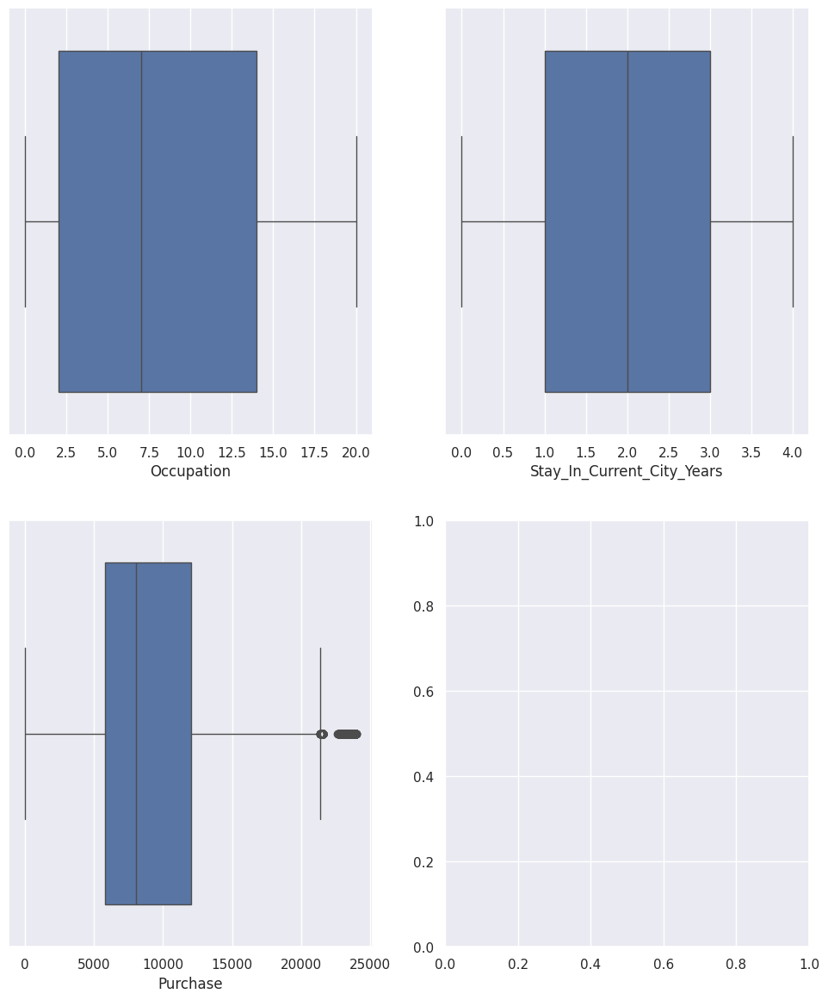

In [109]:
fig, axis = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
fig.subplots_adjust(top=1.2)

sns.boxplot(data=walmart_df, x="Occupation", ax=axis[0,0])
sns.boxplot(data=walmart_df, x="Stay_In_Current_City_Years", orient='h', ax=axis[0,1])
sns.boxplot(data=walmart_df, x="Purchase", orient='h', ax=axis[1,0])


plt.show()

**Obervations:**

Occupation, Stay_In_Current_City_Years are not having outliers.

The Customers Purchase attribute has an average of ~9000.

The Purchase attribute has few outliers

**Purchase & Our Features**

In this section, we'll explore how different features relate to purchases. We'll use box plots to compare purchases across different categories like gender, age, occupation, city category, stay in current city years, marital status, and product category. This will give us insights into which factors influence purchase amounts the most.

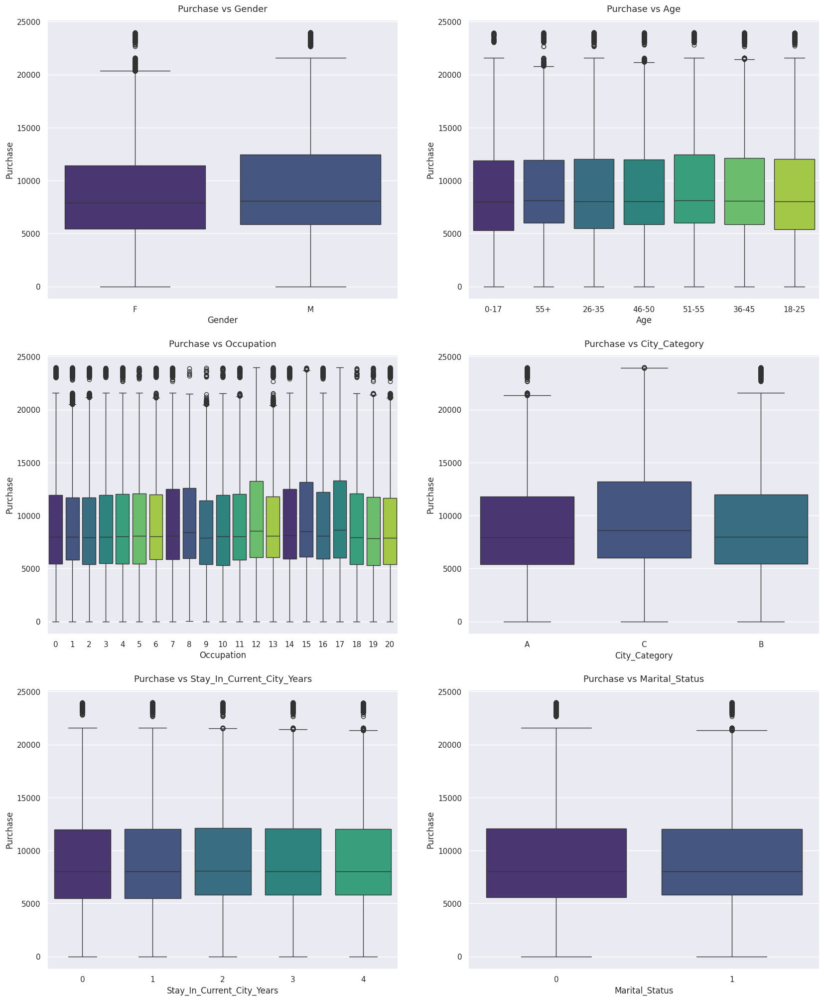

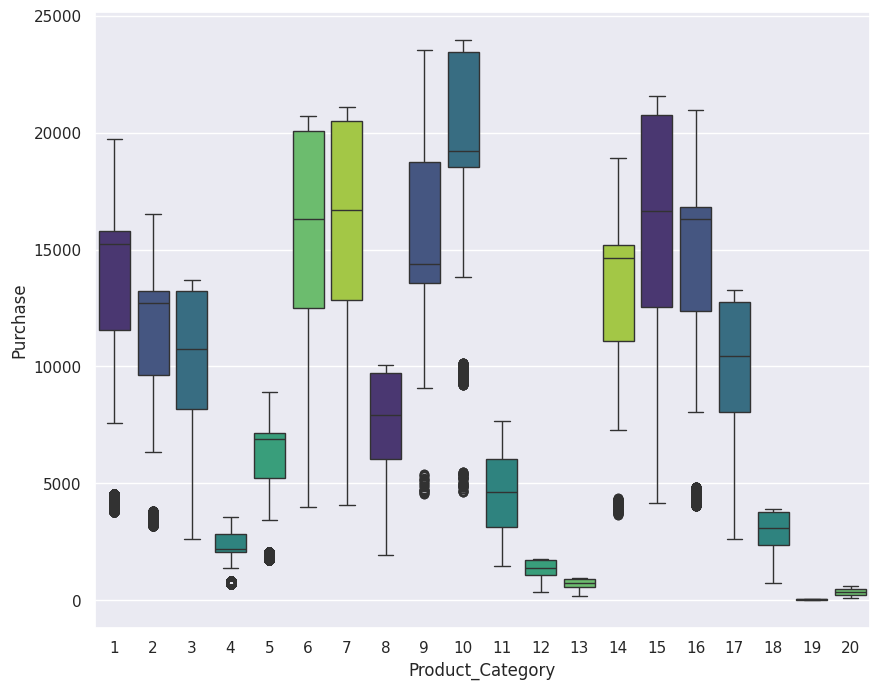

In [59]:
attrs = ['Gender', 'Age', 'Occupation', 'City_Category', 'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category']

fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(20, 16))
fig.subplots_adjust(top=1.3)
count = 0
palette = sns.color_palette("viridis", len(attrs)) # You can choose a different palette like "viridis", "plasma", "inferno", "magma", "cividis" etc.
for row in range(3):
    for col in range(2):
        # Pass the palette to the boxplot function
        sns.boxplot(data=walmart_df, y='Purchase', x=attrs[count], ax=axs[row, col], palette=palette)
        axs[row,col].set_title(f"Purchase vs {attrs[count]}", pad=12, fontsize=13)
        count += 1
plt.show()

plt.figure(figsize=(10, 8))
sns.boxplot(data=walmart_df, y='Purchase', x=attrs[-1], palette=palette)
plt.show()

**Observations:**

1. Product vs Gender Uniform distribution but with a little difference.

2. Purchase vs Age Age and Purchase attributes has a uniform distribution.

3. Purchase vs City_Category Here we can see that customers from City C were the most frequent shoppers on Black Friday sales but Customers from City B had the highest amount of total purchases as we found that in our Count plot.

4. Purchase vs Marital_Status At least the variable Marital Status seems to be a viable predictor for men, although the relative difference in amount is small. We came to know that Single Men spend the most during the Black Friday. It also tells that Men tend to spend less once they are married. It maybe because of the added responsibilities.

5. Purchase vs Product_Category Total of 20 product_categories are there. Product_Category - 1, 5, 8, & 11 have highest purchasing frequency.



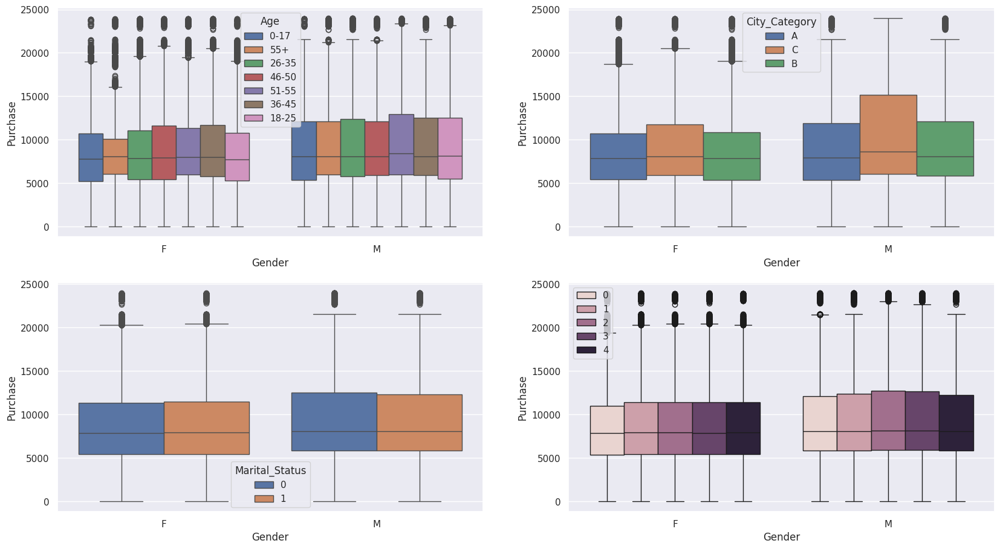

In [60]:
sns.set(color_codes = True)
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(20, 6))

fig.subplots_adjust(top=1.5)
sns.boxplot(data=walmart_df, y='Purchase', x='Gender', hue='Age', ax=axs[0,0])
sns.boxplot(data=walmart_df, y='Purchase', x='Gender', hue='City_Category', ax=axs[0,1])

sns.boxplot(data=walmart_df, y='Purchase', x='Gender', hue='Marital_Status', ax=axs[1,0])
sns.boxplot(data=walmart_df, y='Purchase', x='Gender', hue='Stay_In_Current_City_Years', ax=axs[1,1])
axs[1,1].legend(loc='upper left')

plt.show()

**Observations:**

1. On plotting a Box plot for Gender Vs Purchase, seems like the majority of the population in the ages group 26-35 attended the sale.

2. Most of the transactions were made by men.

3. Age group with most transactions was 26-35.

4. Here we can see that married men buy less and women have roughly the same purchase amount regardless of being married or unmarried. So apparently in this case the bias that married men have to spend more for their spouses is untrue, at least for purchases from this company. Or maybe they can buy less here because they have to spend more money on other things once they are married? We'll never know. At least the variable Marital Status seems to be a viable predictor for men, although the relative difference in amount is small. We can also see something more significant: men spend more than women in total amount!

5. Men and women from City Category C spend more compared to the other categories. Men from that category spend significantly more than women from that category and men in general spend more than women.

6. Stay in the current city is almost uneventful for women. Only when they first arrive will they spend less than in the following years.For men, it's up and down with two years resulting in most spending.

# Data Analysis

We'll investigate whether there is a difference in spending between men and women. By calculating the average spending per transaction for each gender, we can see who tends to spend more and try to understand why.

1. Are women spending more money per transaction than men? Why or Why not?

In [63]:
# Average amount spend per customer for Male and Female
amt_df = walmart_df.groupby(['User_ID', 'Gender'])[['Purchase']].sum()
avg_amt_df = amt_df.reset_index()
avg_amt_df


,User_ID,Gender,Purchase
0,1000001,F,334093
1,1000002,M,810472
2,1000003,M,341635
3,1000004,M,206468
4,1000005,M,821001
...,...,...,...
5886,1006036,F,4116058
5887,1006037,F,1119538
5888,1006038,F,90034
5889,1006039,F,590319


In [64]:
# Gender wise value counts in avg_amt_df
avg_amt_df['Gender'].value_counts()

,count
Gender,
M,4225
F,1666


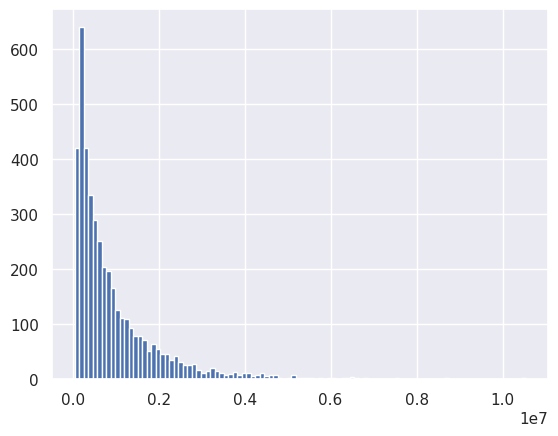

In [65]:
# histogram of average amount spend for each customer - Male
avg_amt_df[avg_amt_df['Gender']=='M']['Purchase'].hist(bins=100)
plt.show()

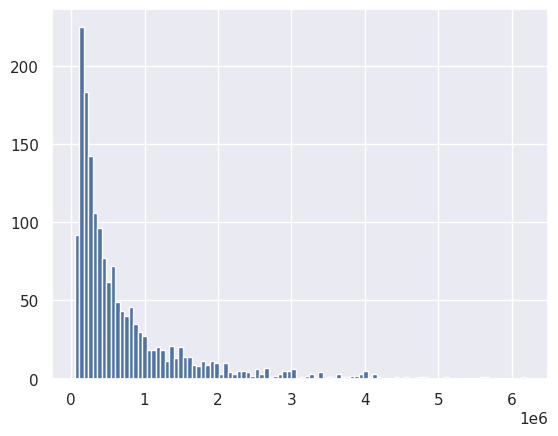

In [66]:
# histogram of average amount spend for each customer - Female
avg_amt_df[avg_amt_df['Gender']=='F']['Purchase'].hist(bins=100)
plt.show()

In [67]:
male_avg = avg_amt_df[avg_amt_df['Gender']=='M']['Purchase'].mean()
female_avg = avg_amt_df[avg_amt_df['Gender']=='F']['Purchase'].mean()

print("Average amount spend by Male customers: {:.2f}".format(male_avg))
print("Average amount spend by Female customers: {:.2f}".format(female_avg))

Average amount spend by Male customers: 925344.40
Average amount spend by Female customers: 712024.39


**Observation**

Male customers spend more money than female customers

Most of the transactions were made by men.



**2. Confidence intervals and distribution of the mean of the expenses by female and male customers**

In [68]:
male_df = avg_amt_df[avg_amt_df['Gender']=='M']
female_df = avg_amt_df[avg_amt_df['Gender']=='F']

In [69]:
genders = ["M", "F"]

male_sample_size = 3000
female_sample_size = 1500
num_repitions = 1000
male_means = []
female_means = []

for _ in range(num_repitions):
    male_mean = male_df.sample(male_sample_size, replace=True)['Purchase'].mean()
    female_mean = female_df.sample(female_sample_size, replace=True)['Purchase'].mean()

    male_means.append(male_mean)
    female_means.append(female_mean)

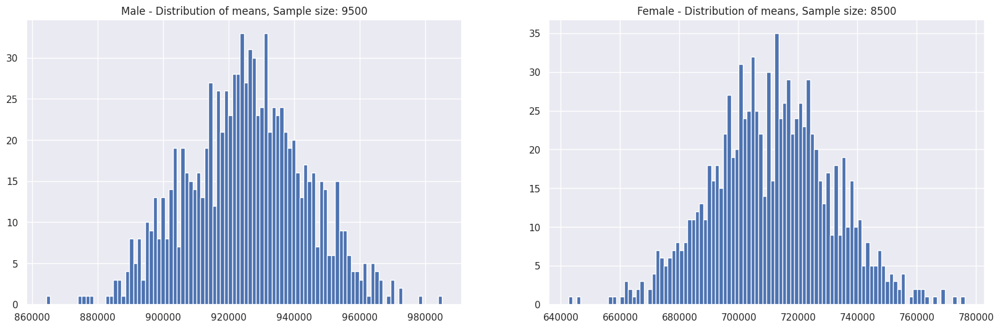



Population mean - Mean of sample means of amount spend for Male: 925471.93
Population mean - Mean of sample means of amount spend for Female: 711178.42

Male - Sample mean: 925344.40 Sample std: 985830.10
Female - Sample mean: 712024.39 Sample std: 807370.73


In [70]:
fig, axis = plt.subplots(nrows=1, ncols=2, figsize=(20, 6))

axis[0].hist(male_means, bins=100)
axis[1].hist(female_means, bins=100)
axis[0].set_title("Male - Distribution of means, Sample size: 9500")
axis[1].set_title("Female - Distribution of means, Sample size: 8500")

plt.show()

print("\n")
print("Population mean - Mean of sample means of amount spend for Male: {:.2f}".format(np.mean(male_means)))
print("Population mean - Mean of sample means of amount spend for Female: {:.2f}".format(np.mean(female_means)))

print("\nMale - Sample mean: {:.2f} Sample std: {:.2f}".format(male_df['Purchase'].mean(), male_df['Purchase'].std()))
print("Female - Sample mean: {:.2f} Sample std: {:.2f}".format(female_df['Purchase'].mean(), female_df['Purchase'].std()))

*Observations:*

Now using the Central Limit Theorem for the population we can say that:



Average amount spend by female customers is 7,12,217.18

1.   Average amount spend by male customers is 9,25,408.28
2. Average amount spend by female customers is 7,12,217.18



In [71]:
male_margin_of_error_clt = 1.64*male_df['Purchase'].std()/np.sqrt(len(male_df))
male_sample_mean = male_df['Purchase'].mean()
male_lower_lim = male_sample_mean - male_margin_of_error_clt
male_upper_lim = male_sample_mean + male_margin_of_error_clt

female_margin_of_error_clt = 1.64*female_df['Purchase'].std()/np.sqrt(len(female_df))
female_sample_mean = female_df['Purchase'].mean()
female_lower_lim = female_sample_mean - female_margin_of_error_clt
female_upper_lim = female_sample_mean + female_margin_of_error_clt

print("Male confidence interval of means: ({:.2f}, {:.2f})".format(male_lower_lim, male_upper_lim))
print("Female confidence interval of means: ({:.2f}, {:.2f})".format(female_lower_lim, female_upper_lim))

Male confidence interval of means: (900471.15, 950217.65)
Female confidence interval of means: (679584.51, 744464.28)


In [72]:
male_margin_of_error_clt = 1.96*male_df['Purchase'].std()/np.sqrt(len(male_df))
male_sample_mean = male_df['Purchase'].mean()
male_lower_lim = male_sample_mean - male_margin_of_error_clt
male_upper_lim = male_sample_mean + male_margin_of_error_clt

female_margin_of_error_clt = 1.96*female_df['Purchase'].std()/np.sqrt(len(female_df))
female_sample_mean = female_df['Purchase'].mean()
female_lower_lim = female_sample_mean - female_margin_of_error_clt
female_upper_lim = female_sample_mean + female_margin_of_error_clt

print("Male confidence interval of means: ({:.2f}, {:.2f})".format(male_lower_lim, male_upper_lim))
print("Female confidence interval of means: ({:.2f}, {:.2f})".format(female_lower_lim, female_upper_lim))

Male confidence interval of means: (895617.83, 955070.97)
Female confidence interval of means: (673254.77, 750794.02)


In [73]:
male_margin_of_error_clt = 2.58*male_df['Purchase'].std()/np.sqrt(len(male_df))
male_sample_mean = male_df['Purchase'].mean()
male_lower_lim = male_sample_mean - male_margin_of_error_clt
male_upper_lim = male_sample_mean + male_margin_of_error_clt

female_margin_of_error_clt = 2.58*female_df['Purchase'].std()/np.sqrt(len(female_df))
female_sample_mean = female_df['Purchase'].mean()
female_lower_lim = female_sample_mean - female_margin_of_error_clt
female_upper_lim = female_sample_mean + female_margin_of_error_clt

print("Male confidence interval of means: ({:.2f}, {:.2f})".format(male_lower_lim, male_upper_lim))
print("Female confidence interval of means: ({:.2f}, {:.2f})".format(female_lower_lim, female_upper_lim))

Male confidence interval of means: (886214.53, 964474.27)
Female confidence interval of means: (660990.91, 763057.88)


**3. Are confidence intervals of average male and female spending overlapping? How can Walmart leverage this conclusion to make changes or improvements?**


The confidence intervals of average male and female spendings are not overlapping.

Walmart can leverage this problem by taking sample dataset and apply this to whole population dataset by performing Central Limit Theorem and Confidence Intervals of 90%, 95%, or 99% by playing around with the width parameter by reporting those observations to Walmart.

**4. Results when the same activity is performed for Married vs Unmarried**

In [74]:
amt_df = walmart_df.groupby(['User_ID', 'Marital_Status'])[['Purchase']].sum()
avg_amt_df = amt_df.reset_index()
avg_amt_df

,User_ID,Marital_Status,Purchase
0,1000001,0,334093
1,1000002,0,810472
2,1000003,0,341635
3,1000004,1,206468
4,1000005,1,821001
...,...,...,...
5886,1006036,1,4116058
5887,1006037,0,1119538
5888,1006038,0,90034
5889,1006039,1,590319


In [75]:
avg_amt_df['Marital_Status'].value_counts()

,count
Marital_Status,
0,3417
1,2474


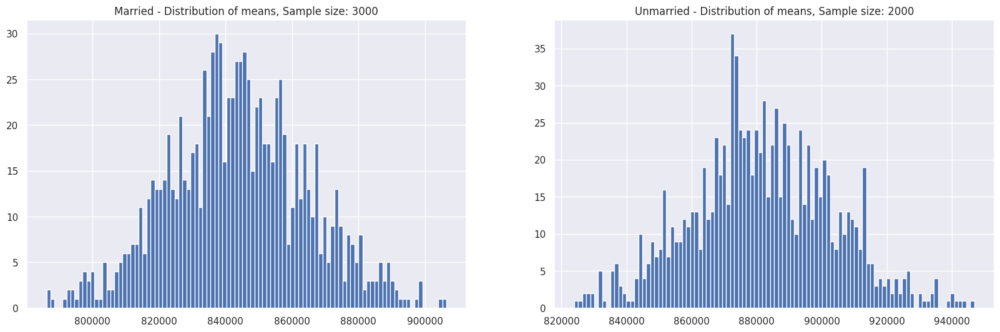



Population mean - Mean of sample means of amount spend for Married: 843726.94
Population mean - Mean of sample means of amount spend for Unmarried: 881584.97

Married - Sample mean: 843526.80 Sample std: 935352.12
Unmarried - Sample mean: 880575.78 Sample std: 949436.25


In [76]:
married_samp_size = 3000
married_samp_size = 2000
num_repitions = 1000
married_means = []
unmarried_means = []

for _ in range(num_repitions):
    married_mean = avg_amt_df[avg_amt_df['Marital_Status']==1].sample(married_samp_size, replace=True)['Purchase'].mean()
    unmarried_mean = avg_amt_df[avg_amt_df['Marital_Status']==0].sample(married_samp_size, replace=True)['Purchase'].mean()

    married_means.append(married_mean)
    unmarried_means.append(unmarried_mean)


fig, axis = plt.subplots(nrows=1, ncols=2, figsize=(20, 6))

axis[0].hist(married_means, bins=100)
axis[1].hist(unmarried_means, bins=100)
axis[0].set_title("Married - Distribution of means, Sample size: 3000")
axis[1].set_title("Unmarried - Distribution of means, Sample size: 2000")

plt.show()
print("\n")
print("Population mean - Mean of sample means of amount spend for Married: {:.2f}".format(np.mean(married_means)))
print("Population mean - Mean of sample means of amount spend for Unmarried: {:.2f}".format(np.mean(unmarried_means)))

print("\nMarried - Sample mean: {:.2f} Sample std: {:.2f}".format(avg_amt_df[avg_amt_df['Marital_Status']==1]['Purchase'].mean(), avg_amt_df[avg_amt_df['Marital_Status']==1]['Purchase'].std()))
print("Unmarried - Sample mean: {:.2f} Sample std: {:.2f}".format(avg_amt_df[avg_amt_df['Marital_Status']==0]['Purchase'].mean(), avg_amt_df[avg_amt_df['Marital_Status']==0]['Purchase'].std()))

In [77]:
for val in ["Married", "Unmarried"]:

    new_val = 1 if val == "Married" else 0

    new_df = avg_amt_df[avg_amt_df['Marital_Status']==new_val]

    margin_of_error_clt = 1.64*new_df['Purchase'].std()/np.sqrt(len(new_df))
    sample_mean = new_df['Purchase'].mean()
    lower_lim = sample_mean - margin_of_error_clt
    upper_lim = sample_mean + margin_of_error_clt

    print("{} confidence interval of means: ({:.2f}, {:.2f})".format(val, lower_lim, upper_lim))

Married confidence interval of means: (812686.46, 874367.13)
Unmarried confidence interval of means: (853938.67, 907212.90)


**5. Results when the same activity is performed for Age**


We will analyze the spending patterns of customers in different age groups. By calculating confidence intervals for each age group, we can see which age range tends to spend more and how certain age groups differ in their spending habits.

In [78]:
amt_df = walmart_df.groupby(['User_ID', 'Age'])[['Purchase']].sum()
avg_amt_df = amt_df.reset_index()
avg_amt_df

,User_ID,Age,Purchase
0,1000001,0-17,334093
1,1000002,55+,810472
2,1000003,26-35,341635
3,1000004,46-50,206468
4,1000005,26-35,821001
...,...,...,...
5886,1006036,26-35,4116058
5887,1006037,46-50,1119538
5888,1006038,55+,90034
5889,1006039,46-50,590319


In [79]:
avg_amt_df['Age'].value_counts()

,count
Age,
26-35,2053
36-45,1167
18-25,1069
46-50,531
51-55,481
55+,372
0-17,218


In [80]:
sample_size = 200
num_repitions = 1000

all_means = {}

age_intervals = ['26-35', '36-45', '18-25', '46-50', '51-55', '55+', '0-17']
for age_interval in age_intervals:
    all_means[age_interval] = []

for age_interval in age_intervals:
    for _ in range(num_repitions):
        mean = avg_amt_df[avg_amt_df['Age']==age_interval].sample(sample_size, replace=True)['Purchase'].mean()
        all_means[age_interval].append(mean)

In [81]:
for val in ['26-35', '36-45', '18-25', '46-50', '51-55', '55+', '0-17']:

    new_df = avg_amt_df[avg_amt_df['Age']==val]

    margin_of_error_clt = 1.64*new_df['Purchase'].std()/np.sqrt(len(new_df))
    sample_mean = new_df['Purchase'].mean()
    lower_lim = sample_mean - margin_of_error_clt
    upper_lim = sample_mean + margin_of_error_clt

    print("For age {}, confidence interval of means: ({:.2f}, {:.2f})".format(val, lower_lim, upper_lim))

For age 26-35, confidence interval of means: (952320.12, 1026998.51)
For age 36-45, confidence interval of means: (832542.56, 926788.86)
For age 18-25, confidence interval of means: (810323.44, 899402.80)
For age 46-50, confidence interval of means: (726410.64, 858686.93)
For age 51-55, confidence interval of means: (703953.00, 822448.85)
For age 55+, confidence interval of means: (487192.99, 592201.50)
For age 0-17, confidence interval of means: (542553.13, 695182.50)


In [82]:
for val in ['26-35', '36-45', '18-25', '46-50', '51-55', '55+', '0-17']:

    new_df = avg_amt_df[avg_amt_df['Age']==val]

    margin_of_error_clt = 1.96*new_df['Purchase'].std()/np.sqrt(len(new_df))
    sample_mean = new_df['Purchase'].mean()
    lower_lim = sample_mean - margin_of_error_clt
    upper_lim = sample_mean + margin_of_error_clt

    print("For age {}, confidence interval of means: ({:.2f}, {:.2f})".format(val, lower_lim, upper_lim))

For age 26-35, confidence interval of means: (945034.42, 1034284.21)
For age 36-45, confidence interval of means: (823347.80, 935983.62)
For age 18-25, confidence interval of means: (801632.78, 908093.46)
For age 46-50, confidence interval of means: (713505.63, 871591.93)
For age 51-55, confidence interval of means: (692392.43, 834009.42)
For age 55+, confidence interval of means: (476948.26, 602446.23)
For age 0-17, confidence interval of means: (527662.46, 710073.17)


In [83]:
for val in ['26-35', '36-45', '18-25', '46-50', '51-55', '55+', '0-17']:

    new_df = avg_amt_df[avg_amt_df['Age']==val]

    margin_of_error_clt = 2.58*new_df['Purchase'].std()/np.sqrt(len(new_df))
    sample_mean = new_df['Purchase'].mean()
    lower_lim = sample_mean - margin_of_error_clt
    upper_lim = sample_mean + margin_of_error_clt

    print("For age {}, confidence interval of means: ({:.2f}, {:.2f})".format(val, lower_lim, upper_lim))

For age 26-35, confidence interval of means: (930918.39, 1048400.25)
For age 36-45, confidence interval of means: (805532.95, 953798.47)
For age 18-25, confidence interval of means: (784794.60, 924931.63)
For age 46-50, confidence interval of means: (688502.19, 896595.37)
For age 51-55, confidence interval of means: (669993.82, 856408.03)
For age 55+, confidence interval of means: (457099.09, 622295.40)
For age 0-17, confidence interval of means: (498811.78, 738923.84)


**Final Insights**


After analyzing the data, we have gathered key insights about customer spending patterns based on age, gender, marital status, city category, and product categories.

**Actionable Insights**


For Age feature, we observed that ~ 80% of the customer's who belong to the age group 25-40 (40%: 26-35, 18%: 18-25, 20%: 36-45) tend to spend the most.

For Gender feature, ~75% of the number of purchases are made by Male customer's and rest of the 25% is done by female customer's. This tells us the Male consumers are the major contributors to the number of sales for the retail store.On average the male gender spends more money on purchase contrary to female, and it is possible to also observe this trend by adding the total value of purchase.

Average amount spend by Male customers: 9,25,408.28

Average amount spend by Female customers: 7,12,217.18

When we combined Purchase and Marital_Status for analysis (60% are Single, 40% are Married). We came to know that Single Men spend the most during the Black Friday. It also tells that Men tend to spend less once they are married. It maybe because of the added responsibilities.

There is an interesting column Stay_In_Current_City_Years, after analyzing this column we came to know the people who have spent 1 year in the city tend to spend the most. This is understandable as, people who have spent more than 4 years in the city are generally well settled and are less interested in buying new things as compared to the people new to the city, who tend to buy more (35% Staying in the city since 1 year, 18% since 2 years, 17% since 3 years).

When examining the City_Category which city the product was purchased to our surprise, even though the city B is majorly responsible for the overall sales income, but when it comes to the above product, it majorly purchased in the city C.

Total of 20 product_categories are there. Product_Category - 1, 5, 8, & 11 have highest purchasing frequency.

There are 20 differnent types of Occupation's in the city

**Recommendations**


Men spent more money than women, So company should focus on retaining the female customers and getting more female customers.

Product_Category - 1, 5, 8, & 11 have highest purchasing frequency. it means these are the products in these categories are liked more by customers. Company can focus on selling more of these products or selling more of the products which are purchased less.

Unmarried customers spend more money than married customers, So company should focus on acquisition of married customers.

Customers in the age 25-40 spend more money than the others, So company should focus on acquisition of customers of other age groups.

The tier-2 city called B has the highest number of population, management should open more outlets in the tier-1 and tier-2 cities like A and C in order to increase the buisness.